In [2]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import tensorflow as tf
import pandas as pd
import glob2
import os
from itertools import product
import numpy as np

import os
import shutil
import urllib
import zipfile
import numpy as np
import pandas as pd
import scipy.io as io
from scipy import interpolate

#Mental note: save as np.float32 instead of float64 next time

#Usually I have this on but its messing with figure.canvas. to rba buffer
# %matplotlib notebook


#%matplotlib

## Notes

So i'm not sure what the .hea files do
It looks like I can do sort of fine for now with default preproc
I'm hoping that I can use the same sampling rate for all the files
I dont really know what that means here


Make a new templates_dir everytime preprocesssing is done differently 

In [2]:
data_dir='./data/'
raw_data_dir =data_dir+'physionet2017/training2017/'
proc_data_dir=data_dir+'processed_physionet2017/'
templates_dir=proc_data_dir+'templates2/'
csv_pth=os.path.join(raw_data_dir,'REFERENCE.csv')
DF=pd.read_csv(csv_pth,header=None,names=['key','label'])
DF['raw data file']=DF['key'].map(lambda k:os.path.join(raw_data_dir,k+'.mat'))
#DF['templates file']=DF['key'].map(lambda k:os.path.join(templates_dir,k+'_templates.csv'))
DF['templates file']=DF['key'].map(lambda k:os.path.join(templates_dir,k+'_templates'))
pat_ecgs=[io.loadmat(fn)['val'][0] for fn in DF['raw data file']]

In [191]:
next(DF.iterrows())

(0, key                                                          A00001
 label                                                             N
 raw data file          ./data/physionet2017/training2017/A00001.mat
 templates file    ./data/processed_physionet2017/templates2/A000...
 Name: 0, dtype: object)

In [194]:
##Good enough for now:


#Maybe 5-10 minutes for the whole thing
ECGs=[]
#for idx, pat in DF.head(15).iterrows():
for idx, pat in DF.iterrows():    
#    try:
        fname=pat['raw data file']
        f=io.loadmat(fname)['val'][0]
        ecg_object=biosppy.ecg.ecg(f,sampling_rate=250.0,show=False)
        ECGs.append(ecg_object)
        T=ecg_object['templates']

#         #np.savetxt( pat['templates file'] ,T)
#         np.save( pat['templates file'] ,T)        
#         T2=np.load( pat['templates file']+'.npy' )        
#         #T2=np.loadtxt( pat['templates file'] )
#         if np.max( np.abs( T-T2 ))>0.:
#             raise Exception

#    except Exception as e:
#        print 'at idx ',idx,'haderror:'
#        print e,'\n'
        

In [198]:
Templates=[E['templates'] for E in ECGs]
#npT = np.array(Templates)
#np.save('./tmp/allTemplates',npT)## not same # templates for each

In [238]:
Labels=[]
for T,idx_pat in zip(Templates,DF.iterrows()):
    idx,pat=idx_pat
    Labels.extend( [pat['label']]*len(T) )

npT = np.concatenate(Templates)
npL = np.stack(Labels)

In [256]:
np.random.seed(22)#same split every time
N=len(npT)
p_train=0.8
n_train=np.int(p_train*N)
perm=np.random.permutation(N)
train_idx=perm[:n_train]
test_idx=perm[n_train:]

trainX=npT[train_idx];trainY=npL[train_idx]
testX =npT[test_idx] ;testY =npL[test_idx]

In [258]:
np.save( proc_data_dir+ 'trainX.npy',trainX )
np.save( proc_data_dir+ 'trainY.npy',trainY )
np.save( proc_data_dir+ 'testX.npy',testX )
np.save( proc_data_dir+ 'testY.npy',testY )

In [259]:
proc_data_dir+ 'testY.npy'

'./data/processed_physionet2017/testY.npy'

In [261]:
len(trainX),len(testX)

(276216, 69055)

In [272]:
DF.index

RangeIndex(start=0, stop=8528, step=1)

In [270]:
DF.label[:20]

0     N
1     N
2     N
3     A
4     A
5     N
6     N
7     O
8     A
9     N
10    N
11    N
12    O
13    N
14    A
15    N
16    O
17    N
18    N
19    O
Name: label, dtype: object

In [276]:
N_pdindex=DF[DF['label']=='N'].index
Nidx=np.array(N_pdindex)

sN_Templates = Templates[ Nidx[800:810] ]

TypeError: only integer scalar arrays can be converted to a scalar index

In [381]:
from vis_utils import plt_latex_settings,show_ecgs#_cluster


ImportError: cannot import name show_ecgs

In [288]:
NNidx = Nidx[ Nidx[800:810] ].astype(np.uint32)

In [293]:
NT = [Templates[n] for n in NNidx]

In [314]:
NNidx

array([2307, 2308, 2309, 2316, 2320, 2327, 2328, 2330, 2331, 2334],
      dtype=uint32)

In [ ]:
#ECG=biosppy.ecg.ecg(Arr[2307],sampling_rate=250.0)

In [327]:
nn= 1
print 'NNidx:',NNidx[nn]
NN_Arr=Arr[NNidx[nn]]
cluster=NT[nn]
cluster.shape

NNidx: 2308


(34, 150)

### Plot Cluster

<IPython.core.display.Javascript object>


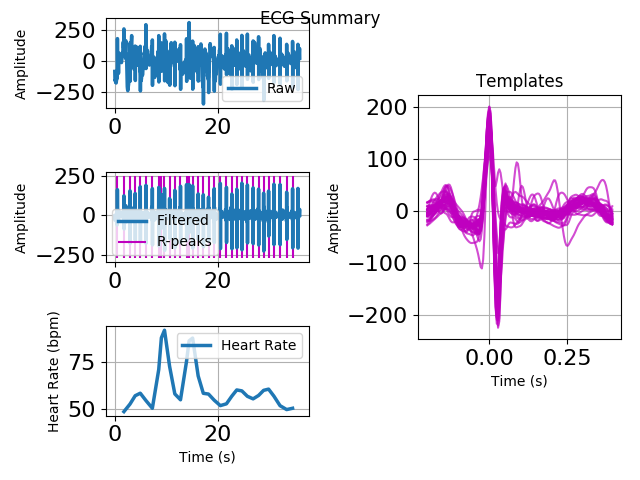

In [328]:
#ECG=biosppy.ecg.ecg(Arr[2307],sampling_rate=250.0)
ECG=biosppy.ecg.ecg(NN_Arr,sampling_rate=250.0)

In [330]:
medline=np.median(cluster,axis=0)
time=np.linspace(-0.2,0.4,150)
fig,ax=plt.subplots()
ax.plot(time,cluster.T,c='m')
ax.plot(time,medline  ,c=cp,linewidth=3.5)
ax.grid(True)
ax.set_xlabel('')

In [347]:
zero_time = np.where(time>=0.)[0][0]

In [380]:
#from vis_utils import show_ecgs

ImportError: cannot import name show_ecgs

In [378]:
%load_ext autoreload

In [342]:
Clusters =  NT[5:]
X = np.concatenate(Clusters,axis=0)

In [349]:
peak_vals.shape

(153, 1)

In [350]:
X.shape

(153, 150)

<IPython.core.display.Javascript object>


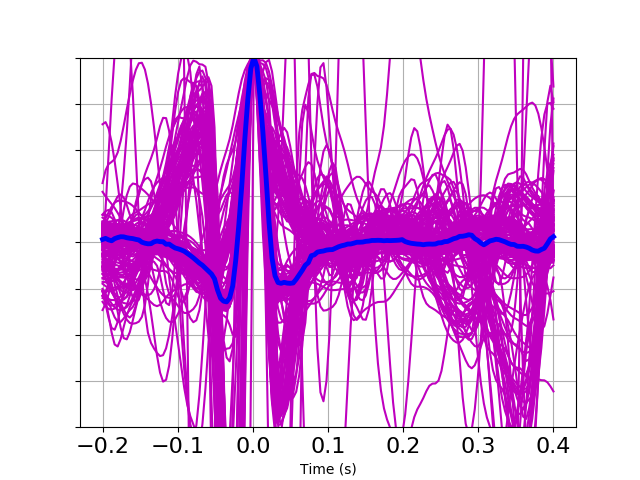

(-1.0, 1.0)

In [361]:
plt_X = X / X[:,zero_time:zero_time+1]

medline=np.median( plt_X ,axis=0)
time=np.linspace(-0.2,0.4,150)
fig,ax=plt.subplots()
ax.plot(time,plt_X.T,c='m')
ax.plot(time,medline  ,c=cp,linewidth=3.5)
ax.grid(True)
ax.set_xlabel('Time (s)')
ax.set_yticklabels([])
ax.set_ylim([-1.,1.])

In [291]:
A=Templates[NNidx,:,:]

TypeError: list indices must be integers, not tuple

In [ ]:
Templates

In [289]:
NNidx

array([2307, 2308, 2309, 2316, 2320, 2327, 2328, 2330, 2331, 2334],
      dtype=uint32)

In [285]:
NNidx.dtype

dtype('int64')

In [282]:
a= Templates[_]

TypeError: only integer scalar arrays can be converted to a scalar index

array([2307, 2308, 2309, 2316, 2320, 2327, 2328, 2330, 2331, 2334])

In [268]:
len(Labels),len(shapes),len(DF),len(Templates)

(345271, 8528, 8528, 8528)

In [237]:
pat[1]

key                                                          A00001
label                                                             N
raw data file          ./data/physionet2017/training2017/A00001.mat
templates file    ./data/processed_physionet2017/templates2/A000...
Name: 0, dtype: object

In [224]:
L=['a',cp]
L.extend(['c',]*4)


In [225]:
L

['a', 'b', 'c', 'c', 'c', 'c']

In [202]:
T2=np.load('./tmp/allTemplates.npy',allow_pickle=True)

In [212]:
npT=np.stack(Templates,axis=0)

ValueError: all input arrays must have the same shape

In [263]:
shapes=[T.shape for T in Templates]

In [264]:
shapes[:20],len(shapes)

([(39, 150),
  (36, 150),
  (82, 150),
  (31, 150),
  (110, 150),
  (28, 150),
  (30, 150),
  (70, 150),
  (47, 150),
  (65, 150),
  (35, 150),
  (33, 150),
  (45, 150),
  (17, 150),
  (30, 150),
  (41, 150),
  (73, 150),
  (26, 150),
  (47, 150),
  (39, 150)],
 8528)

In [216]:
Shapes=np.vstack(shapes)
np.unique(Shapes[:,0])

array([  3,   6,   7,   8,   9,  10,  11,  12,  13,  14,  15,  16,  17,
        18,  19,  20,  21,  22,  23,  24,  25,  26,  27,  28,  29,  30,
        31,  32,  33,  34,  35,  36,  37,  38,  39,  40,  41,  42,  43,
        44,  45,  46,  47,  48,  49,  50,  51,  52,  53,  54,  55,  56,
        57,  58,  59,  60,  61,  62,  63,  64,  65,  66,  67,  68,  69,
        70,  71,  72,  73,  74,  75,  76,  77,  78,  79,  80,  81,  82,
        83,  84,  85,  86,  87,  88,  89,  90,  91,  92,  93,  94,  95,
        96,  97,  98,  99, 100, 101, 102, 103, 104, 105, 106, 107, 108,
       109, 110, 111, 112, 114, 115, 116, 117, 118, 119, 120, 122, 123,
       124, 125, 126, 128, 129, 130, 131, 132, 134, 136, 137, 138, 140,
       141, 142, 143, 148, 150, 158, 164, 170, 172, 178, 221])

In [211]:
npT.shape

(345271, 150)

In [204]:
npT.shape

(8528,)

In [205]:
T2.shape

(8528,)

<IPython.core.display.Javascript object>


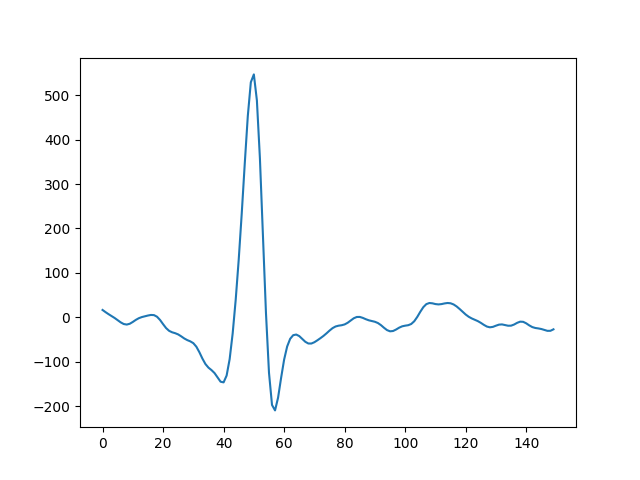

In [196]:
plt.plot(ECGs[780]['templates'][8])

<IPython.core.display.Javascript object>


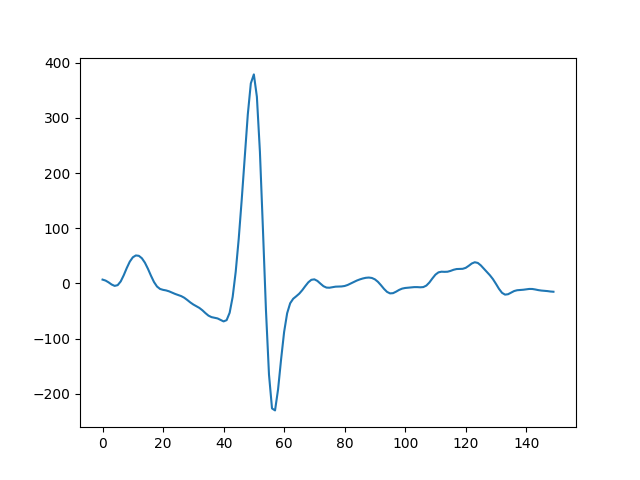

In [197]:
plt.plot(ECGs[2222]['templates'][8])

In [262]:
npT.shape

(345271, 150)

In [190]:
##How should I store the processed templates

In [201]:
%%timeit -n10
npT2=np.load('./tmp/allTemplates.npy',allow_pickle=True)

10 loops, best of 3: 237 ms per loop


In [189]:
%%timeit -n10
for idx, pat in DF.iterrows():
        T2=np.load( pat['templates file']+'.npy' )

10 loops, best of 3: 2.94 s per loop


In [188]:
pat['templates file']

'./data/processed_physionet2017/templates2/A08528_templates'

In [170]:
pat

key                                                          A00015
label                                                             A
raw data file          ./data/physionet2017/training2017/A00015.mat
templates file    ./data/processed_physionet2017/templates1/A000...
Name: 14, dtype: object

In [147]:
T=ecg_object['templates']

In [151]:
with open('tmp/T.csv','w') as f:
    np.savetxt(T,f)

IOError: [Errno 2] No such file or directory: 'tmp/T.csv'

In [153]:
np.savetxt('tmp/T.csv',T)

In [156]:
T2=np.loadtxt('tmp/T.csv')

In [161]:
T2.shape

(31, 150)

In [163]:
T.shape

(31, 150)

In [160]:
np.min(T-T2)

0.0

In [100]:
Arr=[io.loadmat(fn)['val'][0] for fn in DF['raw data file']]

In [193]:
Arr.shape

AttributeError: 'list' object has no attribute 'shape'

In [71]:
test
fn0= DF['raw data file'][0]
T0=Traces

In [84]:
%%timeit -n1
lenths=np.array([io.loadmat(fn)['val'][0] for fn in DF['files']])

1 loop, best of 3: 890 ms per loop


In [91]:
#somewhat time prohibitive
with warnings.catch_warnings():
    warnings.simplefilter("ignore")#biosppy does some deprecated things
    ecg_objects=[biosppy.ecg.ecg(f,sampling_rate=200.0,show=False) for f in Arr]

ValueError: Not enough beats to compute heart rate.

In [95]:
#Maybe 10 minutes for the whole thing
bad=[]
for idx, f in enumerate(Arr):
    try:
        ecg_object=biosppy.ecg.ecg(f,sampling_rate=200.0,show=False)
    except Exception as e:
        print 'at idx ',idx,'haderror:'
        print e,'\n'
        bad.append((idx,f))
    

at idx  1757 haderror:
Not enough beats to compute heart rate. 



In [103]:
f

array([-237, -286, -338, ...,  -16,  -17,  -18], dtype=int16)

In [105]:
bad[1757]

(1757, array([ 34,  48,  56, ..., -16, -12,  -6], dtype=int16))

<IPython.core.display.Javascript object>


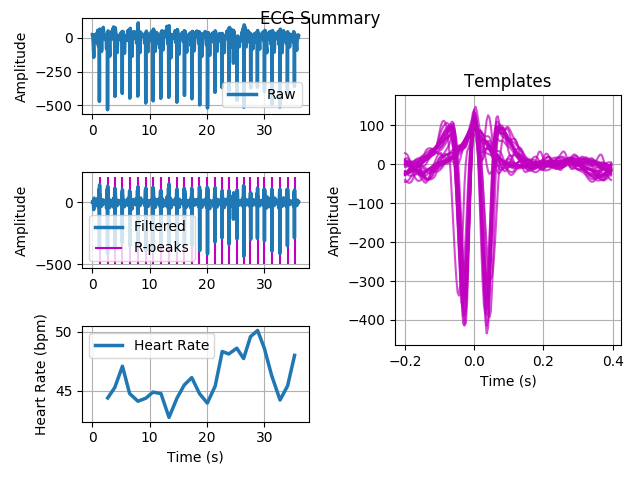

In [318]:
#ECG=biosppy.ecg.ecg(Arr[1757],sampling_rate=200.0)
#ECG=biosppy.ecg.ecg(Arr[1757])
ECG=biosppy.ecg.ecg(Arr[2307],sampling_rate=250.0)


<IPython.core.display.Javascript object>


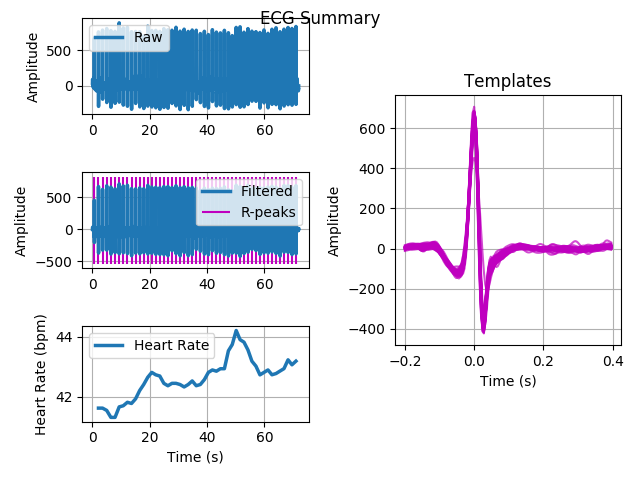

In [135]:
#ECG=biosppy.ecg.ecg(Arr[1757],sampling_rate=200.0)
#ECG=biosppy.ecg.ecg(Arr[1757])
ECG=biosppy.ecg.ecg(Arr[1757],sampling_rate=250.0)


<IPython.core.display.Javascript object>


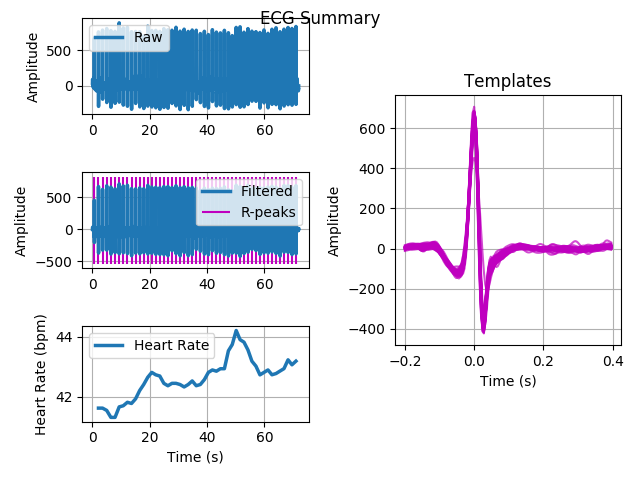

In [295]:
#ECG=biosppy.ecg.ecg(Arr[1757],sampling_rate=200.0)
#ECG=biosppy.ecg.ecg(Arr[1757])
ECG=biosppy.ecg.ecg(Arr[1757],sampling_rate=250.0)


<IPython.core.display.Javascript object>


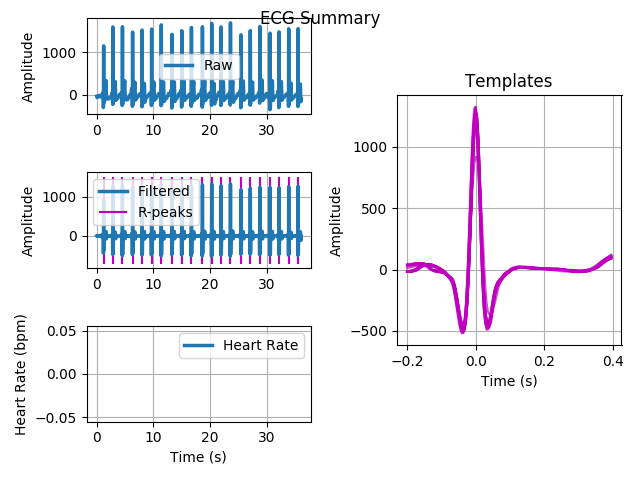

In [296]:
row=np.random.choice(len(Arr))
ECG=biosppy.ecg.ecg(Arr[row],sampling_rate=250.0)

<IPython.core.display.Javascript object>


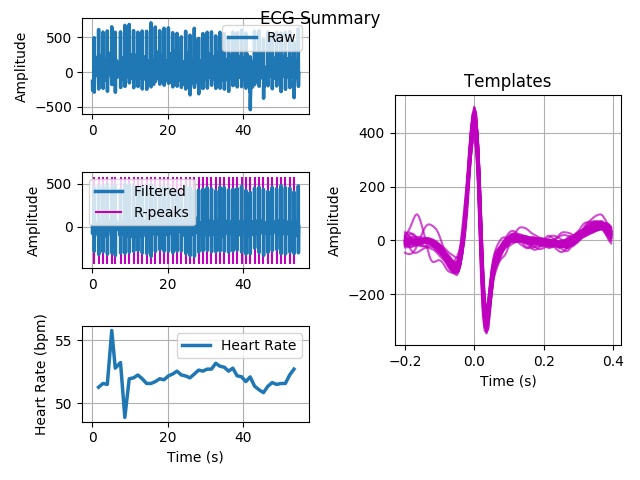

In [141]:
ECG=biosppy.ecg.ecg(Arr[row],sampling_rate=200.0)

<IPython.core.display.Javascript object>


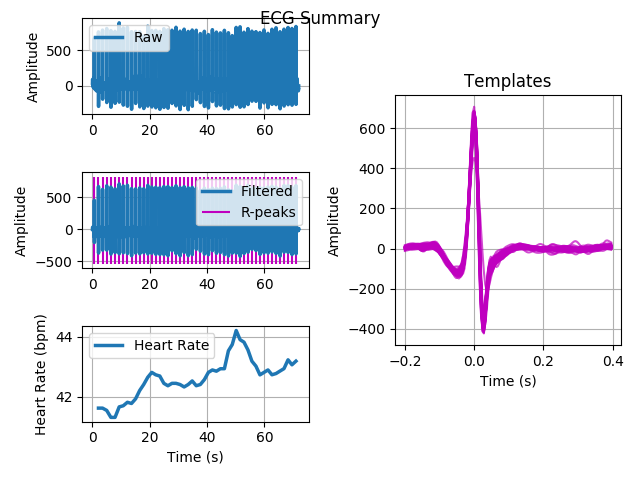

In [297]:
ECG=biosppy.ecg.ecg(Arr[1757],sampling_rate=250.0)

<IPython.core.display.Javascript object>


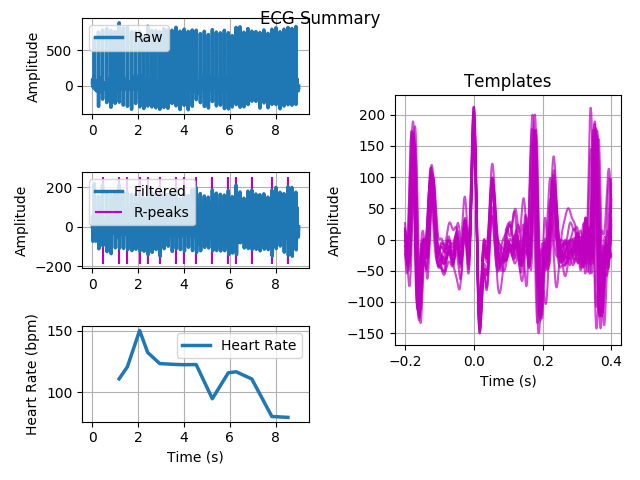

In [134]:
ECG=biosppy.ecg.ecg(Arr[1757],sampling_rate=2000.0)

In [115]:
ECG

ReturnTuple(ts=array([0.00000000e+00, 4.99944444e-03, 9.99888889e-03, ...,
       4.49800017e+01, 4.49850011e+01, 4.49900006e+01]), filtered=array([ -21.14618845,  -97.38871479, -181.65978323, ...,  -20.74191706,
        -11.49937476,   -2.26566305]), rpeaks=array([ 197,  416,  623,  820, 1011, 1137, 1208, 1410, 1628, 1849, 2062,
       2271, 2484, 2701, 2924, 3138, 3343, 3548, 3754, 3961, 4168, 4367,
       4562, 4763, 4967, 5173, 5383, 5589, 5789, 5992, 6202, 6417, 6635,
       6848, 7063, 7279, 7493, 7705, 7907, 8109, 8313, 8524, 8735]), templates_ts=array([-2.00000000e-01, -1.95000000e-01, -1.90000000e-01, -1.85000000e-01,
       -1.80000000e-01, -1.75000000e-01, -1.70000000e-01, -1.65000000e-01,
       -1.60000000e-01, -1.55000000e-01, -1.50000000e-01, -1.45000000e-01,
       -1.40000000e-01, -1.35000000e-01, -1.30000000e-01, -1.25000000e-01,
       -1.20000000e-01, -1.15000000e-01, -1.10000000e-01, -1.05000000e-01,
       -1.00000000e-01, -9.50000000e-02, -9.00000000e-02, -8.5000

In [ ]:
[io.loadmat(fn)['val'][0] for fn in DF['files']]

<IPython.core.display.Javascript object>


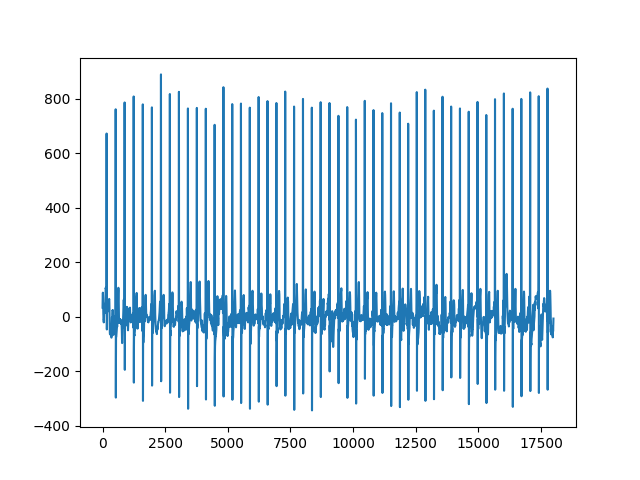

In [108]:
plt.plot(badecg)

<IPython.core.display.Javascript object>


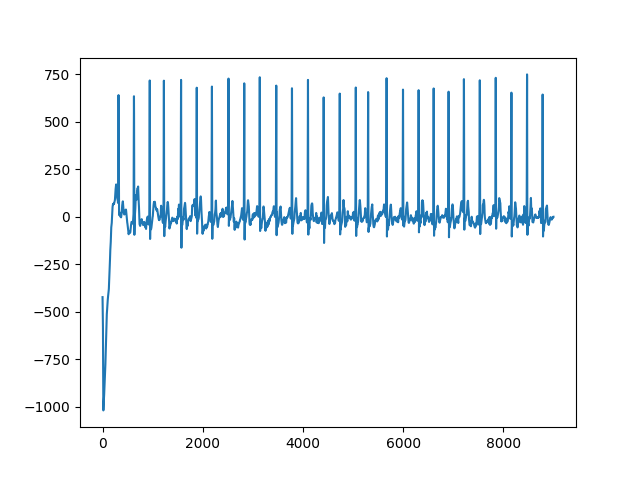

In [109]:
plt.plot(Arr[1800])

In [7]:
f=io.loadmat(fn0)['val'][0]

In [8]:
len(f)

9000

<IPython.core.display.Javascript object>


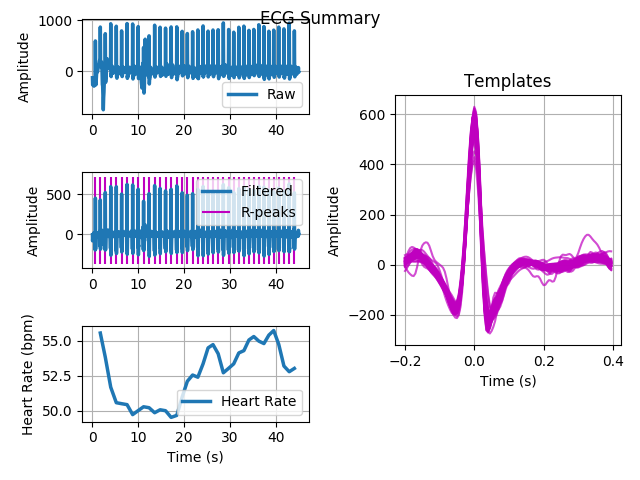

In [63]:
import biosppy
#from biosppy.signals import ecg
#from biosppy.signals.tools import filter_signal
import warnings
with warnings.catch_warnings():
    warnings.simplefilter("ignore")#biosppy does some deprecated things
    #sECG= biosppy.signals.ecg.ecg(f,sampling_rate=200.0)
    ECG = biosppy.ecg.ecg(f,sampling_rate=200.0)

In [12]:
%%timeit -n22
ECG=biosppy.ecg.ecg(f,sampling_rate=200.0,show=False)

22 loops, best of 3: 52.2 ms per loop


In [64]:
T=ECG['templates']

In [19]:
##preferred method but requires python3 for numpy1.7
#np.random.default_rng
#https://github.com/numpy/numpy/issues/10835
#rng = np.random.default_rng()
#points = rng.random((10,2))
#rng.choice(points)

sId=np.random.choice()


Object `np.random.default_rng` not found.


<IPython.core.display.Javascript object>


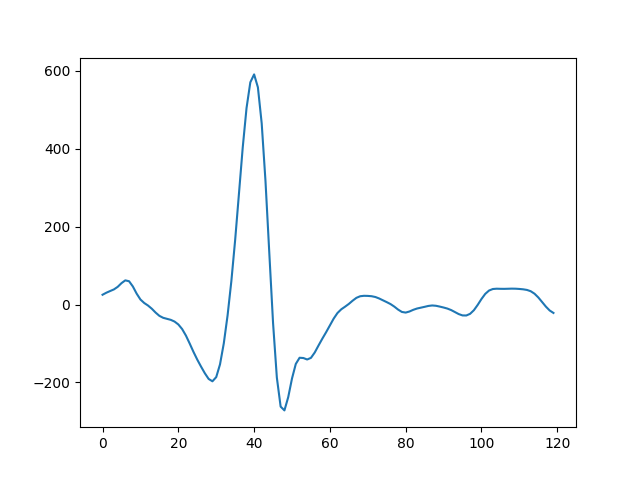

In [60]:
saT=T[np.random.choice(T.shape[0])]
plt.plot(saT)

In [64]:
##ref https://github.com/Seb-Good/deepecg/blob/master/deepecg/training/data/ecg.py
##    https://biosppy.readthedocs.io/en/stable/biosppy.signals.html#biosppy-signals-tools
#order = int(0.3 * 200)
#
## Filter waveform
#fS, _, _ = filter_signal(signal=f, ftype='FIR', band='bandpass', order=order,
#                               frequency=[3, 45], sampling_rate=200)

In [89]:
ECG.keys()

['ts',
 'filtered',
 'rpeaks',
 'templates_ts',
 'templates',
 'heart_rate_ts',
 'heart_rate']

In [88]:
ECG['heart_rate']

array([55.55792618, 53.83091215, 51.68716633, 50.57992179, 50.50900735,
       50.44154462, 49.72909093, 50.01638534, 50.28960938, 50.22158911,
       49.86397369, 50.07494415, 50.00748143, 49.53124236, 49.67488182,
       50.98055424, 52.11169599, 52.5576683 , 52.40241291, 53.35973241,
       54.49713467, 54.73105279, 54.08154398, 52.71827213, 53.04004187,
       53.35894484, 54.13558355, 54.30087622, 55.06220092, 55.30902309,
       54.98140264, 54.80671108, 55.40979542, 55.73741587, 54.75391009,
       53.20200287, 52.79430555, 53.03030303])

# Proprocessing Above Here

In [95]:
Clusters[3][1].shape

[autoreload of vis_utils failed: Traceback (most recent call last):
  File "/home/chris/.virtualenvs/tensorflow-2.0/local/lib/python2.7/site-packages/IPython/extensions/autoreload.py", line 247, in check
    superreload(m, reload, self.old_objects)
  File "vis_utils.py", line 46
    def ovrlyd_ecgs(pos_X,neg_X,**kwargs):
      ^
IndentationError: expected an indented block
]


(4171, 150)

# Visualization Below Here

##  Load some test case ECGs

In [12]:
from vis_utils import plt_latex_settings,show_ecgs
from utils import SH,DIFF
%load_ext autoreload
%autoreload 2
from utils import SH,DIFF
#can mess with getting rga buffers from canvas
%matplotlib notebook

plt_latex_settings()
time=np.linspace(-0.2,0.4,150)
zero_time = np.where(time>=0.)[0][0]# 0~time[50]

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [13]:
fn_part='./logs/Model_0228_003046_trop1d_tinyExp_72acc/peot_partitions/PeOT_{}{}.{}{}.npy'
fmts=['{}']
part_names=[]
fmats=[('{}',0,0,'Or'),('{}',1,0,'And'),('{}',1,1,'And'),('{}',1,2,'And'),('{}',1,3,'And')]
part_names=[fn_part.format(*fm) for fm in fmats]
# part_names
loadC = lambda pth: (np.load(pth.format('pos'))[...,0],np.load(pth.format('neg'))[...,0])
Clusters=[loadC(fmp) for fmp in part_names]

In [14]:
def basic_ecg(X,ax):
    plt_X = X / X[:,zero_time:zero_time+1]#peak normalize
    medline=np.median( plt_X ,axis=0)
#     ax.plot(time,plt_X.T,c='m',alpha=0.01,linewidth=3.)
    ax.plot(time,plt_X.T,c='m',alpha=0.01)
    ax.plot(time,medline  ,c=cp,linewidth=3.5)
    ax.grid(True)
#     ax.set_xlabel('Time (s)')
    ax.set_yticklabels([])
    ax.set_ylim([-1.,1.])

<IPython.core.display.Javascript object>


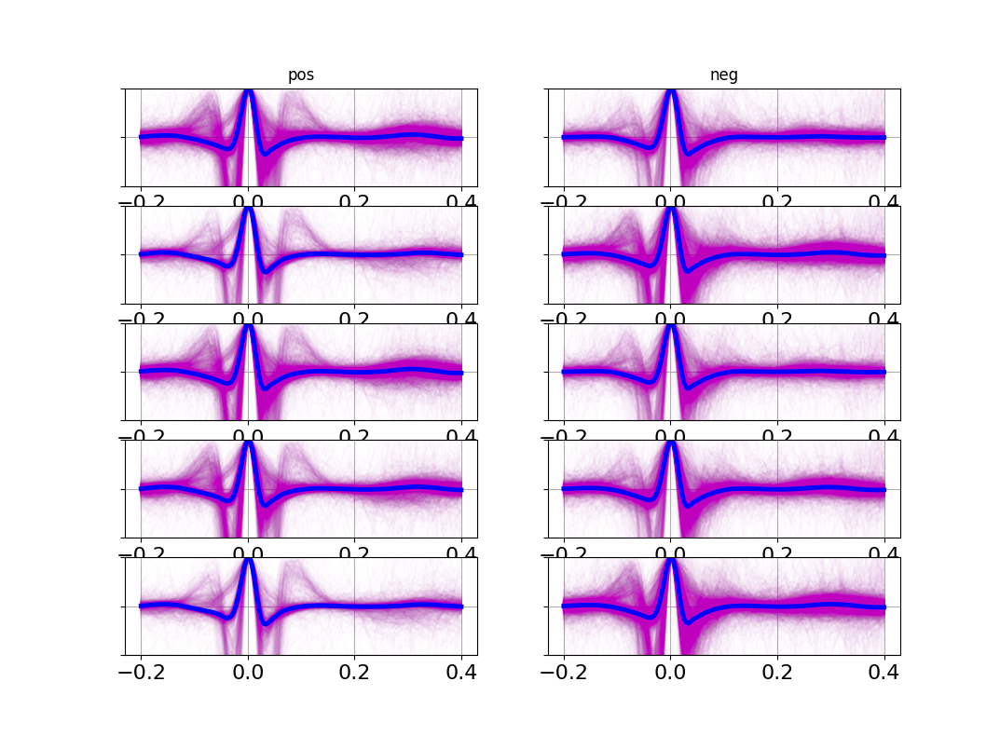

In [15]:
fig,axes=plt.subplots(5,2)
r=0
for C,axrow in zip(Clusters,axes):
    pos_ax,neg_ax=axrow
    pos_C,neg_C = C
    basic_ecg(pos_C,pos_ax)
    basic_ecg(neg_C,neg_ax)
#     show_ecgs(pos_C,fig=fig,ax=pos_ax)
#     show_ecgs(neg_C,fig=fig,ax=neg_ax)
    if r==0:
        pos_ax.set_title('pos')
        neg_ax.set_title('neg')
    r+=1

<IPython.core.display.Javascript object>


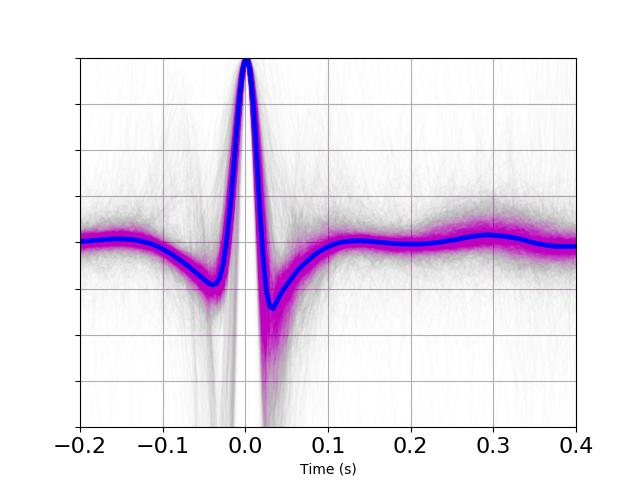

(-0.2, 0.4)

In [70]:
#def show_ecgs( X ,fig=None,ax=None):
X=Clusters[3][1]

#if ax is None:
fig,ax=plt.subplots()
#    plt_latex_settings()#good enough
time=np.linspace(-0.2,0.4,150)
zero_time = np.where(time>=0.)[0][0]# 0~time[50]

plt_X = X / X[:,zero_time:zero_time+1]#peak normalize

medline=np.median( plt_X ,axis=0)
# ax.plot(time,plt_X.T,c='m',alpha=0.008)#good
ax.plot(time,plt_X.T,c='m',alpha=0.005)
ax.plot(time,medline  ,c=cp,linewidth=3.5)
ax.grid(True)
ax.set_xlabel('Time (s)')
ax.set_yticklabels([])
ax.set_ylim([-1.,1.])
ax.set_xlim([time.min(),time.max()])
# return fig,ax
###Rev order 

### What if we don't peak normalize for vis

<IPython.core.display.Javascript object>


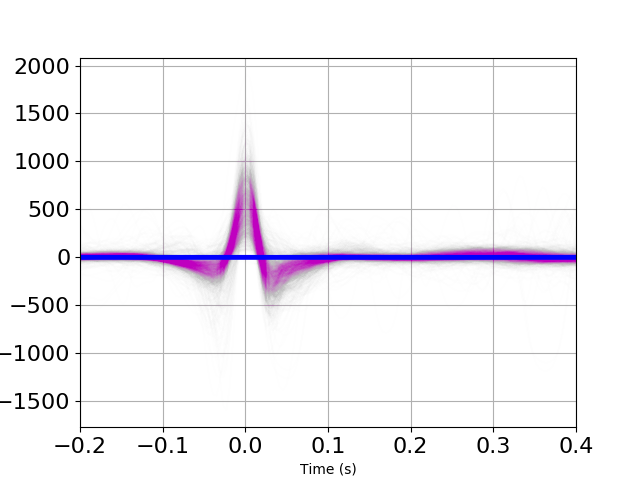

(-0.2, 0.4)

In [99]:
X=Clusters[3][1] #shape= (4171, 150)

fig,ax=plt.subplots()
time=np.linspace(-0.2,0.4,150)
zero_time = np.where(time>=0.)[0][0]# 0~time[50]

#SKIP
# plt_X = X / X[:,zero_time:zero_time+1]#peak normalize
plt_X = X

medline=np.median( plt_X ,axis=0)
ax.plot(time,plt_X.T,c='m',alpha=0.005)
ax.plot(time,medline  ,c='b',linewidth=3.5)
ax.grid(True)
ax.set_xlabel('Time (s)')
# ax.set_yticklabels([])
# ax.set_ylim([-1.,1.])
ax.set_xlim([time.min(),time.max()])


<IPython.core.display.Javascript object>


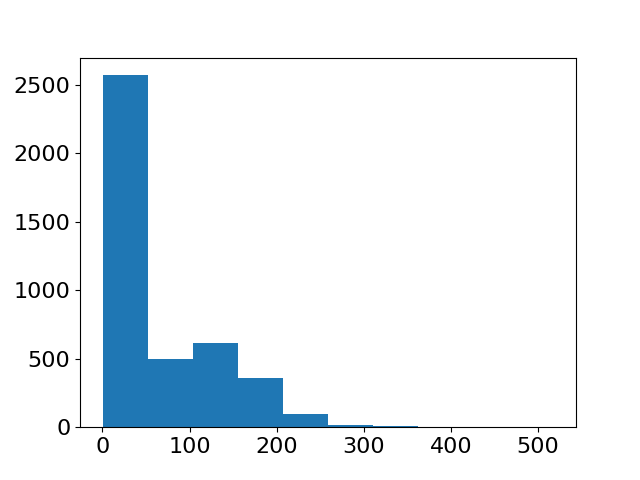

In [104]:
fig,ax=plt.subplots()
sd=np.std(X,axis=1)
plt.hist(sd)
plt.show()

##### Some plots are actually *already* normalized

<IPython.core.display.Javascript object>


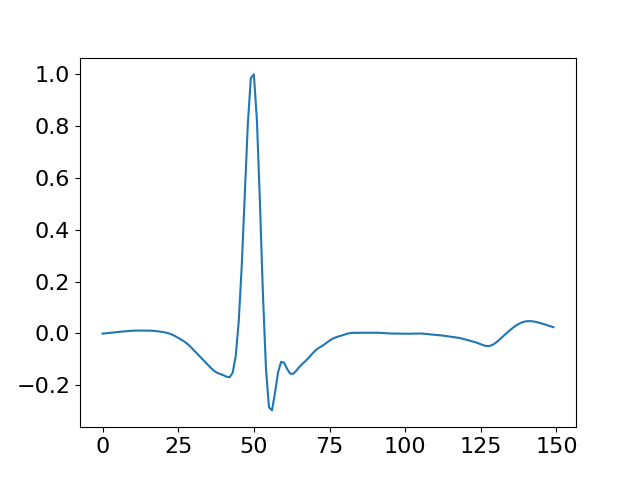

In [116]:

fig,ax=plt.subplots()
steadyX = X[ sd == sd.min() ].ravel()
plt.plot(steadyX)

In [127]:
# np.sum(X.min(axis=1)>0)#no mins 
MrgClusters = [np.concatenate(pmC,axis=0) for pmC in Clusters]
ALL=np.concatenate(MrgClusters,axis=0)
for X in MrgClusters:
    maxneg = np.max(X,axis=1)<0.
    minpos = np.min(X,axis=1)>0.

    print maxneg.any(), minpos.any()

False False
False False
False False
False False
False False


In [154]:
LOW = ALL[ -ALL.min(axis=1)  >  ALL.max(axis=1) ]
HGH = ALL[ -ALL.min(axis=1)  <  ALL.max(axis=1) ]
SH([LOW,HGH,ALL])

fig,axes=plt.subplots(2);time=np.linspace(-0.2,0.4,150);zero_time=np.where(time>=0.)[0][0]
axH,axL=axes

plt_HGH=resample_m(HGH,4000)
plt_LOW=resample_m(LOW,4000)

# plt_HGH/=np.max(np.abs(HGH),axis=1,keepdims=True)
plt_HGH = volt_norm1(plt_HGH)
plt_LOW = volt_norm1(plt_LOW)

axH.plot(time,plt_HGH.T,c='m',alpha=0.005)
axL.plot(time,plt_LOW.T,c='m',alpha=0.005)

axH.plot(time,np.median( HGH ,axis=0)  ,c='b',linewidth=3.5)
axL.plot(time,np.median( LOW ,axis=0)  ,c='b',linewidth=3.5)


#SKIP
# plt_X = X / X[:,zero_time:zero_time+1]#peak normalize
# plt_X = Xb

medline=np.median( HGH ,axis=0)
ax.grid(True)
ax.set_xlabel('Time (s)')
# ax.set_yticklabels([])
# ax.set_ylim([-1.,1.])
ax.set_xlim([time.min(),time.max()])

0  :  (7578, 150)
1  :  (27422, 150)
2  :  (35000, 150)


[autoreload of vis_utils failed: Traceback (most recent call last):
  File "/home/chris/.virtualenvs/tensorflow-2.0/local/lib/python2.7/site-packages/IPython/extensions/autoreload.py", line 247, in check
    superreload(m, reload, self.old_objects)
  File "vis_utils.py", line 59
    def ovrlyd_ecgs(pos_X,neg_X,**kwargs):
      ^
IndentationError: expected an indented block
]


<IPython.core.display.Javascript object>

ImportError: cannot import name volt_norm1

In [155]:
%load_ext autoreload
%autoreload 2
from vis_utils import volt_norm1

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


ImportError: cannot import name volt_norm1

### Conclude: Should have fixed polarization before using biosig.ECG
#### its messing with the pk alignment

In [152]:
df=pd.DataFrame()
df['hgh']=plt_HGH[:,zero_time]
df['low']=plt_LOW[:,zero_time]
df.describe()

,hgh,low
count,4000.000000,4000.000000
mean,519.309570,237.457504
std,326.605957,171.423737
min,1.000000,-92.595520
25%,311.108818,123.780136
50%,517.151703,229.051941
75%,728.978149,338.584717
max,2991.830811,1934.864746


In [139]:
abM=np.max(np.abs(plt_HGH),axis=1,keepdims=True)

In [140]:
_=plt_HGH/abM

In [142]:
np.std(np.abs( np.median(HGH,axis=1) ))

7.58983

In [143]:
Hz=HGH[:,zero_time];Lz=LOW[:,zero_time]

[autoreload of vis_utils failed: Traceback (most recent call last):
  File "/home/chris/.virtualenvs/tensorflow-2.0/local/lib/python2.7/site-packages/IPython/extensions/autoreload.py", line 247, in check
    superreload(m, reload, self.old_objects)
  File "vis_utils.py", line 50
    def ovrlyd_ecgs(pos_X,neg_X,**kwargs):
      ^
IndentationError: expected an indented block
]


In [149]:
Hz.shape

(27422,)

,hgh,low
count,4000.000000,4000.000000
mean,519.309570,237.457504
std,326.605957,171.423737
min,1.000000,-92.595520
25%,311.108818,123.780136
50%,517.151703,229.051941
75%,728.978149,338.584717
max,2991.830811,1934.864746


<IPython.core.display.Javascript object>


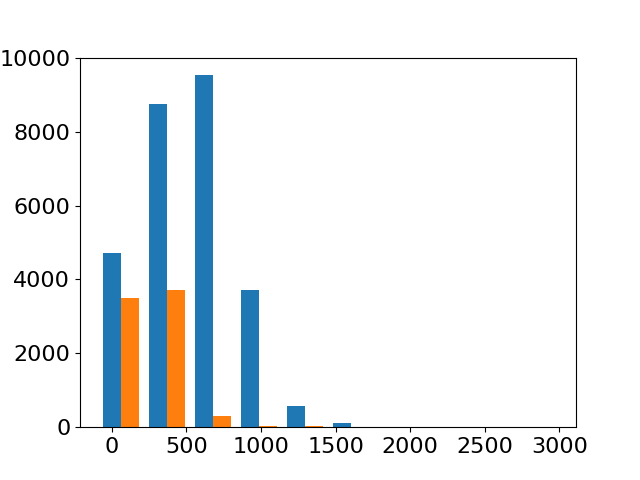

([array([4.720e+03, 8.750e+03, 9.527e+03, 3.710e+03, 5.740e+02, 1.200e+02,
         1.300e+01, 4.000e+00, 0.000e+00, 4.000e+00]),
  array([3509., 3713.,  308.,   24.,   20.,    0.,    4.,    0.,    0.,
            0.])],
 array([ -92.59552,  215.8471 ,  524.28973,  832.73236, 1141.175  ,
        1449.6177 , 1758.0603 , 2066.503  , 2374.9456 , 2683.3882 ,
        2991.8308 ], dtype=float32),
 <a list of 2 Lists of Patches objects>)

In [145]:
fig,ax=plt.subplots()
plt.hist([Hz,Lz])

In [135]:
print 'low:',LOW.min(),LOW.max(),LOW.std(),'hgh:',HGH.min(),HGH.max(),HGH.std()

low: -4023.556 1934.8647 133.93712 hgh: -1706.3634 2991.8308 133.77701


In [132]:
HGH.shape

(27422, 150)

## Can we try to overlap plot again? just double alpha-blend

In [92]:
Xp,Xn=Clusters[3]
SH([Xp,Xn])
%matplotlib notebook
from vis_utils import resample_m
cp='b';cn='r'

0  :  (2829, 150)
1  :  (4171, 150)


In [159]:
#def show_ecgs( X ,fig=None,ax=None):
Xp,Xn=Clusters[3]
N=2500
pos_X,neg_X = Xp[:N],Xn[:N]

time=np.linspace(-0.2,0.4,150)
zero_time = np.where(time>=0.)[0][0]# 0~time[50]

pos_X/=pos_X[:,zero_time:zero_time+1]
neg_X/=neg_X[:,zero_time:zero_time+1]

<IPython.core.display.Javascript object>


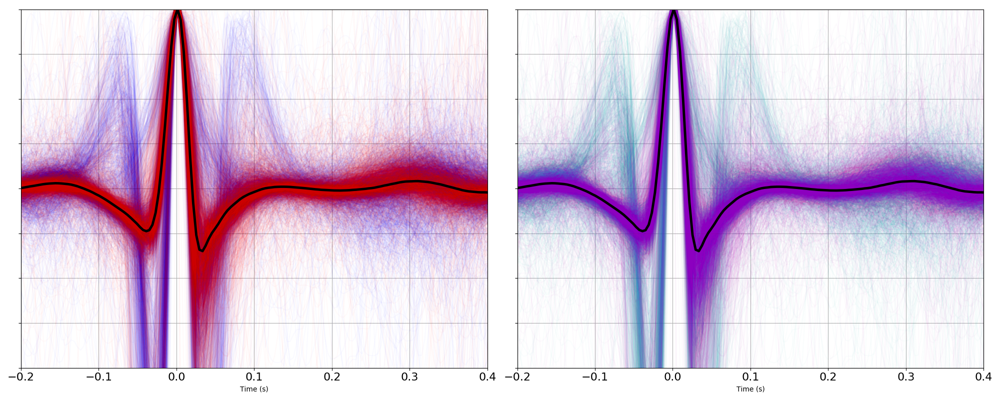

In [82]:
alpha=0.02 #m=2k
fig,axes=plt.subplots(1,2,figsize=(20,8))
ax1,ax2=axes

all_X=np.concatenate([pos_X,neg_X],axis=0)
medline=np.median( all_X ,axis=0)

med_X=np.median( all_X ,axis=0)
pos_med_X=np.median( pos_X ,axis=0)
neg_med_X=np.median( neg_X ,axis=0)


ax1.plot(time,pos_X.T,c=cp,alpha=alpha)
ax1.plot(time,neg_X.T,c='r',alpha=alpha)

ax2.plot(time,pos_X.T,c='c',alpha=alpha)
ax2.plot(time,neg_X.T,c='m',alpha=alpha)



for ax in [ax1,ax2]:
    ax.plot(time,medline  ,c='k',linewidth=3.5)
    ax.grid(True)
    ax.set_xlabel('Time (s)')
    ax.set_yticklabels([])
    ax.set_ylim([-1.,1.])
    ax.set_xlim([time.min(),time.max()])
# return fig,ax
###Rev order
plt.tight_layout()
plt.show()

#### should we draw +- medians seperately?

<IPython.core.display.Javascript object>


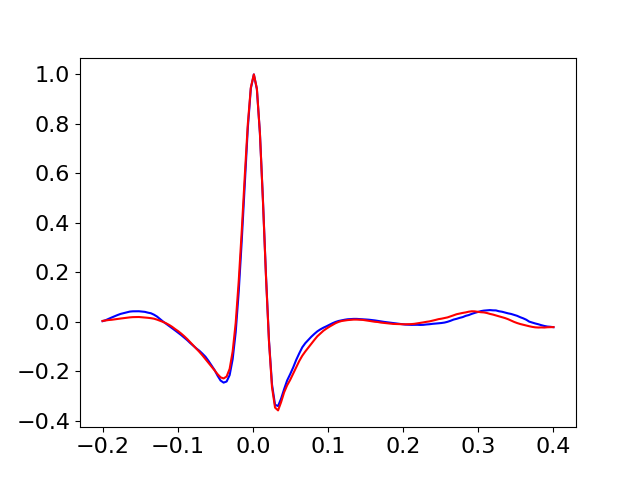

In [162]:
ax,fig=plt.subplots()
med_X=np.median( all_X ,axis=0)
pos_med_X=np.median( pos_X ,axis=0)
neg_med_X=np.median( neg_X ,axis=0)
plt.plot(time,pos_med_X,'b')
plt.plot(time,neg_med_X,'r')


#### Does order Matter?   (ans:yes)

In [85]:
SH([pos_X,neg_X])

0  :  (2500, 150)
1  :  (2500, 150)


<IPython.core.display.Javascript object>


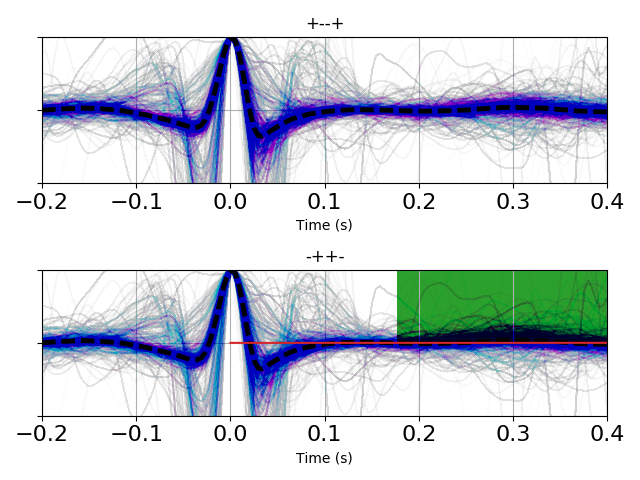

In [94]:
alpha=0.005 #m=2k
# fig,axes=plt.subplots(1,2,figsize=(20,8))
fig,axes=plt.subplots(2)#vert
ax1,ax2=axes

# cp='b';cn='r'
# cp='g';cn='m'
cp='c';cn='m'

all_X=np.concatenate([pos_X,neg_X],axis=0)
medline=np.median( all_X ,axis=0)

m=1500
pos_X=resample_m(pos_X,m)
neg_X=resample_m(neg_X,m)

ax1.set_title('pos b4 neg')
ax1.plot(time,pos_X.T,c=cp,alpha=alpha)
ax1.plot(time,neg_X.T,c=cn,alpha=alpha)
ax2.set_title('neg b4 pos')
ax2.plot(time,neg_X.T,c=cn,alpha=alpha)
ax2.plot(time,pos_X.T,c=cp,alpha=alpha)

ax1.set_title('+--+')
ax1.plot(time,pos_X.T,c=cp,alpha=alpha)
ax1.plot(time,neg_X.T,c=cn,alpha=alpha)
ax1.plot(time,neg_X.T,c=cn,alpha=alpha)
ax1.plot(time,pos_X.T,c=cp,alpha=alpha)
ax2.set_title('-++-')
ax2.plot(time,neg_X.T,c=cn,alpha=alpha)
ax2.plot(time,pos_X.T,c=cp,alpha=alpha)
ax2.plot(time,pos_X.T,c=cp,alpha=alpha)
ax2.plot(time,neg_X.T,c=cn,alpha=alpha)


for ax in [ax1,ax2]:
#     ax.plot(time,medline  ,c='k',linewidth=3.5)
    ax.plot(time,medline,'k--',linewidth=3.5)
    ax.grid(True)
    ax.set_xlabel('Time (s)')
    ax.set_yticklabels([])
    ax.set_ylim([-1.,1.])
    ax.set_xlim([time.min(),time.max()])
# return fig,ax
###Rev order
plt.tight_layout()
plt.show()

In [88]:
fig.savefig(DL+'alpha_order_invariance.png',dpi=400)

In [87]:
DL='/home/chris/Downloads/'

### What can alpha be?

In [22]:
X.shape

(4171, 150)

<IPython.core.display.Javascript object>


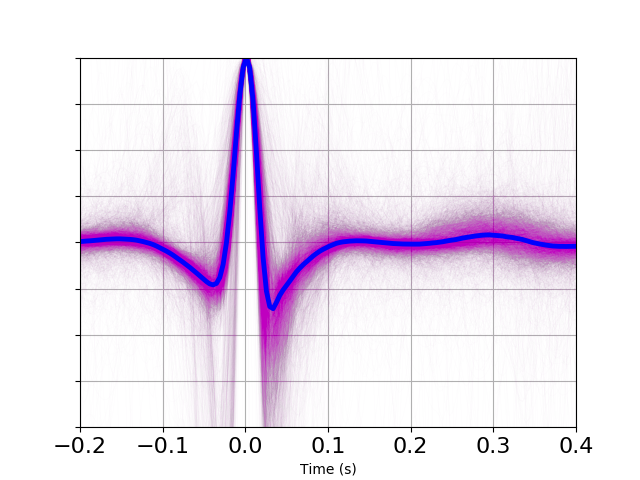

(-0.2, 0.4)

In [28]:
X=Clusters[3][1]
alpha=0.01
# alpha=0.0025
# X=X[3000:]
# X=X[:1100]

lw=.5

fig,ax=plt.subplots()
time=np.linspace(-0.2,0.4,150)
zero_time = np.where(time>=0.)[0][0]# 0~time[50]

plt_X = X / X[:,zero_time:zero_time+1]#peak normalize

medline=np.median( plt_X ,axis=0)
ax.plot(time,plt_X.T,c='m',alpha=alpha,linewidth=lw)
ax.plot(time,medline  ,c=,linewidth=3.5)
ax.grid(True)
ax.set_xlabel('Time (s)')
ax.set_yticklabels([])
ax.set_ylim([-1.,1.])
ax.set_xlim([time.min(),time.max()])
# return fig,ax
###Rev order 

## How do we use Len X to discount alpha? 

#### Soln: set alpha = const. / len(X)

In [33]:
al=np.linspace(0.,1.,150)
mul=

In [39]:
.9**10

0.3486784401000001

In [41]:
.99**100

0.3660323412732292

In [52]:
L.max()

100000.0

<IPython.core.display.Javascript object>


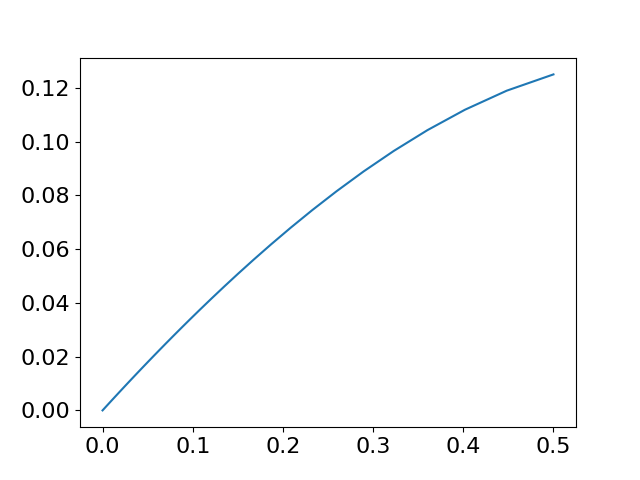

In [51]:
L=np.logspace(np.log10(2),5,100)
a=L**-1
mul=a*(1.-a)**L
plt.plot(a,mul)  #  --> mul decreases ~ linear with a ~ (1/num_samples)

<IPython.core.display.Javascript object>


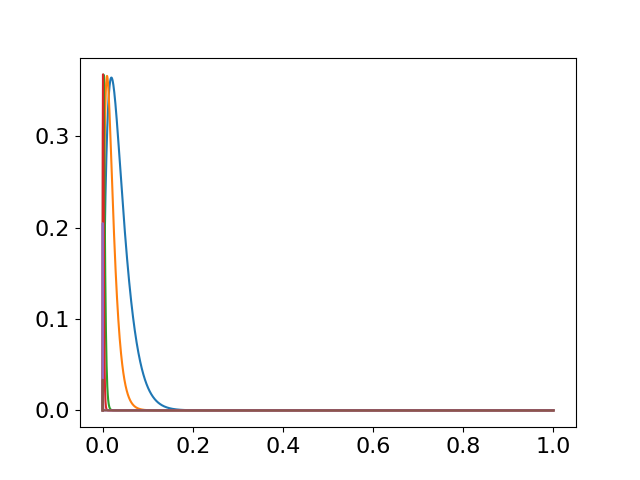

In [56]:
for m in [50,100,500,1000,5000,10000]:
    # m=50  #num samples
    al=np.linspace(0.,1.,2000)
    mul=al*((1.-al)**m)
    plt.plot(al,mul*m)   #huh. Try to maximize (ma)(1-a)**m over a in terms of m

In [ ]:
#m*(1-a)^m + (ma)(-m)(1-a)^(m-1)  = 0

In [ ]:
#m(1-a)^m  = (am^2)(1-a)^(m-1)

In [ ]:
#m(1-a)  = (am^2)
# (1-a)  = (am)
# (1-a)/a = m    or     1 = a(m+1)

In [57]:
1./4100

0.00024390243902439024

In [ ]:
#suggest: alpha = (0.01)*4100/num_samples  = 41/len(X)

<IPython.core.display.Javascript object>


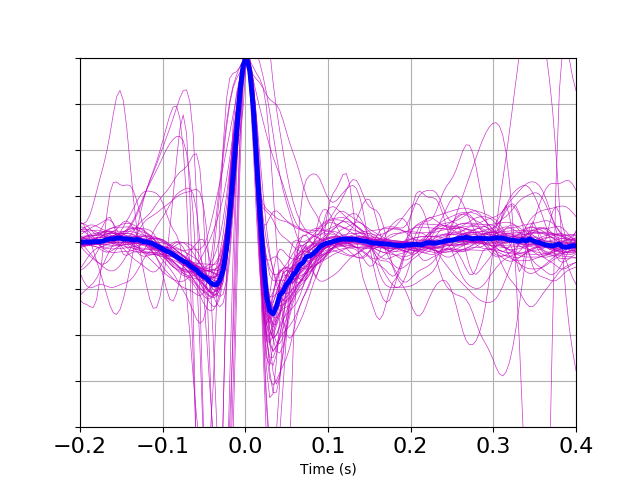

(-0.2, 0.4)

In [61]:
X=Clusters[3][1]
# X=X[:100]
X=X[:50]

alC = 40.
alpha= alC/(len(X)+1)

# alpha=0.01
# alpha=0.001
# alpha=0.0025
# X=X[3000:]
# X=X[:1100]

lw=.5

fig,ax=plt.subplots()
time=np.linspace(-0.2,0.4,150)
zero_time = np.where(time>=0.)[0][0]# 0~time[50]

plt_X = X / X[:,zero_time:zero_time+1]#peak normalize

medline=np.median( plt_X ,axis=0)
ax.plot(time,plt_X.T,c='m',alpha=alpha,linewidth=lw)
ax.plot(time,medline  ,c='b',linewidth=3.5)
ax.grid(True)
ax.set_xlabel('Time (s)')
ax.set_yticklabels([])
ax.set_ylim([-1.,1.])
ax.set_xlim([time.min(),time.max()])

In [62]:
alpha

0.7843137254901961

In [ ]:
    if ax is None:
        fig,ax=plt.subplots()
        plt_latex_settings()#good enough
    time=np.linspace(-0.2,0.4,150)
    zero_time = np.where(time>=0.)[0][0]# 0~time[50]

    plt_X = X / X[:,zero_time:zero_time+1]#peak normalize

    medline=np.median( plt_X ,axis=0)
    ax.plot(time,plt_X.T,c='m',alpha=alpha,linewidth=linewidth,**kwargs)


In [ ]:


plt.xticks([]) # labels 
plt.yticks([])
ax.xaxis.set_ticks_position('none') # tick markers
ax.yaxis.set_ticks_position('none')


ax.get_xaxis().set_visible(False)
ax.get_yaxis().set_visible(False)
plt.tight_layout()

In [ ]:
plt.savefig(record_dir+'/noanno_scatter_data.pdf')
plt.savefig(record_dir+'/noanno_scatter_data.jpg')#png

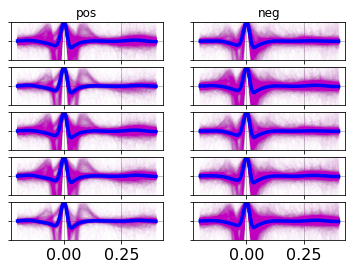

In [10]:
plt.show()

<IPython.core.display.Javascript object>


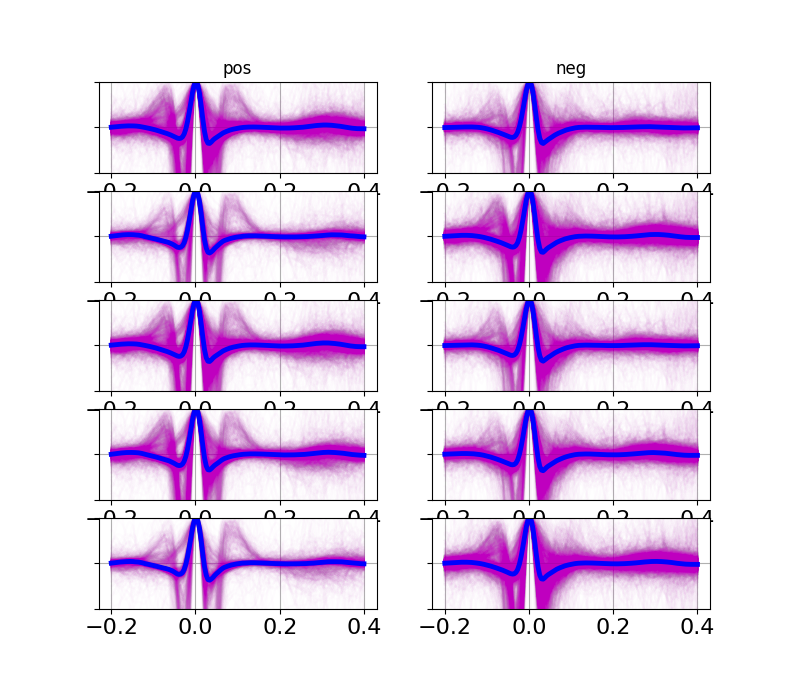

In [36]:
fig,axes=plt.subplots(5,2)
r=0
for C,axrow in zip(Clusters,axes):
    pos_ax,neg_ax=axrow
    pos_C,neg_C = C
    basic_ecg(pos_C,pos_ax)
    basic_ecg(neg_C,neg_ax)
#     show_ecgs(pos_C,fig=fig,ax=pos_ax)
#     show_ecgs(neg_C,fig=fig,ax=neg_ax)
    if r==0:
        pos_ax.set_title('pos')
        neg_ax.set_title('neg')
    r+=1

###  Try difference

In [117]:
Xp,Xn=Clusters[0]


part_names

[SH(c) for c in Clusters]

In [118]:
Xp.shape,Xn.shape

((4748, 150), (2252, 150))

<IPython.core.display.Javascript object>


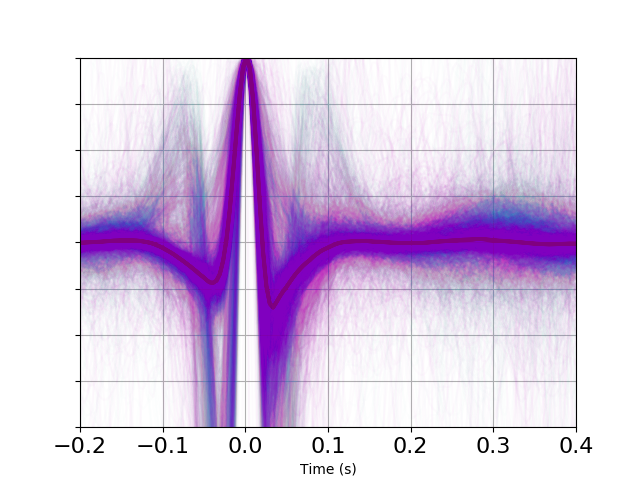

(-0.2, 0.4)

In [121]:
#def show_ecgs( X ,fig=None,ax=None):
Xp,Xn=Clusters[0]
N=max(len(Xp),len(Xn))
ap=N/float(len(Xp))
an=N/float(len(Xn))


#if ax is None:
fig,ax=plt.subplots()
#    plt_latex_settings()#good enough
time=np.linspace(-0.2,0.4,150)
zero_time = np.where(time>=0.)[0][0]# 0~time[50]

plt_Xp = Xp / Xp[:,zero_time:zero_time+1]#peak normalize
plt_Xn = Xn / Xn[:,zero_time:zero_time+1]#peak normalize


pos_medline=np.median( plt_Xp ,axis=0)
neg_medline=np.median( plt_Xn ,axis=0)
ax.plot(time,pos_medline  ,c=cp,linewidth=3.5,alpha=0.5)
ax.plot(time,neg_medline  ,c='r',linewidth=3.5,alpha=0.5)

ax.plot(time,plt_Xp.T,c='c',alpha=0.008*ap)
ax.plot(time,plt_Xn.T,c='m',alpha=0.008*an)

ax.grid(True)
ax.set_xlabel('Time (s)')
ax.set_yticklabels([])
ax.set_ylim([-1.,1.])
ax.set_xlim([time.min(),time.max()])

# return fig,ax
###Regular order

In [122]:
from matplotlib.backends.backend_agg import FigureCanvas

<IPython.core.display.Javascript object>


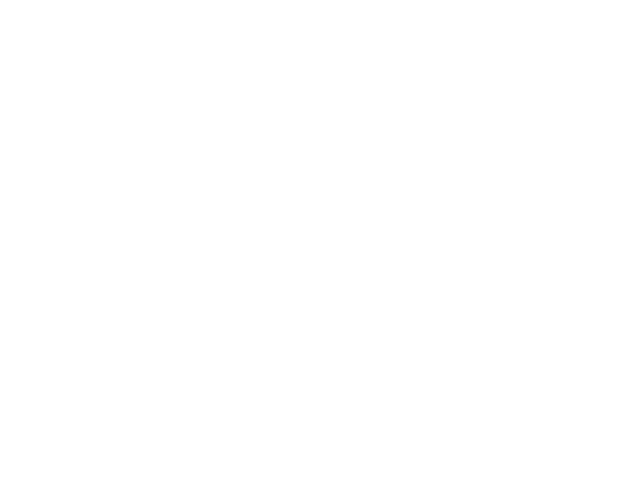

NameError: name 'FigureCanvas' is not defined

In [16]:
#def show_ecgs( X ,fig=None,ax=None):
X=Clusters[0][0]
fig,ax=plt.subplots()

canvas = FigureCanvas(fig)

time=np.linspace(-0.2,0.4,150)
zero_time = np.where(time>=0.)[0][0]# 0~time[50]
plt_X = X / X[:,zero_time:zero_time+1]#peak normalize
ax.plot(time,medline  ,c=cp,linewidth=3.5)
ax.plot(time,plt_X.T,c='m',alpha=0.008)
medline=np.median( plt_X ,axis=0)##order matters..
ax.grid(True)
ax.set_xlabel('Time (s)')
ax.set_yticklabels([])
ax.set_ylim([-1.,1.])

canvas.draw()
# Buf = np.array(canvas.renderer.buffer_rgba())
# w,h = fig.canvas.get_width_height()
# Buf.shape=(w,h,4)
# return fig,ax
###Regular order

In [133]:
Buf = np.array(canvas.renderer.buffer_rgba())
w,h = fig.canvas.get_width_height()
# Buf.shape=(w,h,4)
Buf=Buf.reshape((w,h,4))

<IPython.core.display.Javascript object>


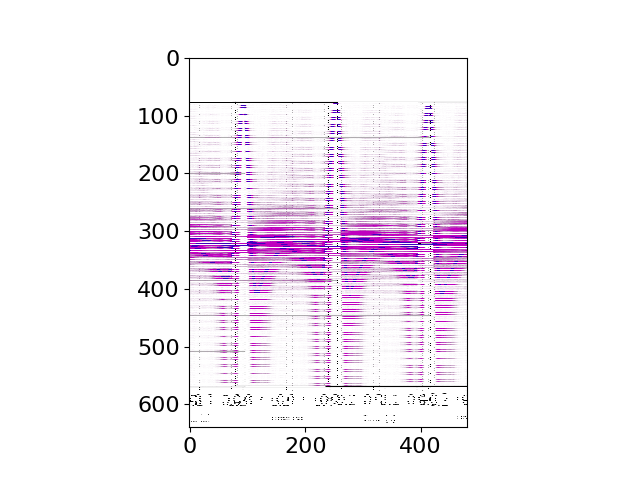

In [135]:
fig2 = plt.figure()
ax2 = fig2.add_subplot(111, frameon=False)
ax2.imshow(Buf)
plt.show()

In [132]:
Buf.shape

(640, 480, 4)

In [109]:
ax.plot?

In [110]:
import matplotlib as mpl
mpl.rcParams['lines.linewidth'] 

1.5

In [113]:
X.shape

(4748, 150)

### alpha test

<IPython.core.display.Javascript object>


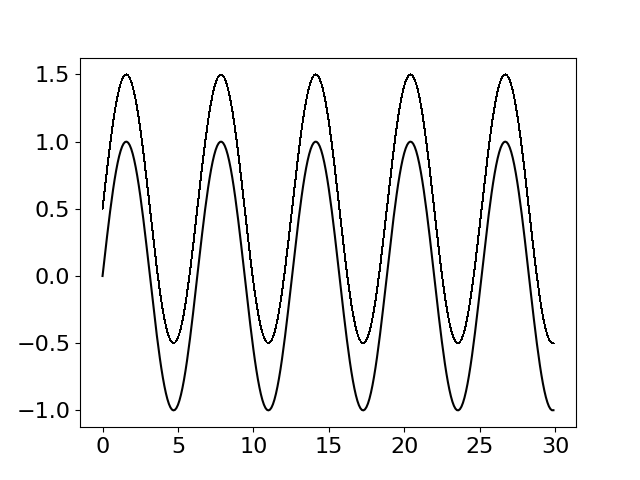

In [58]:
tt=np.arange(0,30,0.1)
yy=np.sin(tt)
yy2=yy+0.5
plt.plot(tt,yy,c='k',alpha=1.)
nplot=500
for _ in range(nplot):
    plt.plot(tt,yy2,c='k',alpha=1./float(nplot))
# plt.plot(tt,yy2,c='k',alpha=0.5)


<IPython.core.display.Javascript object>


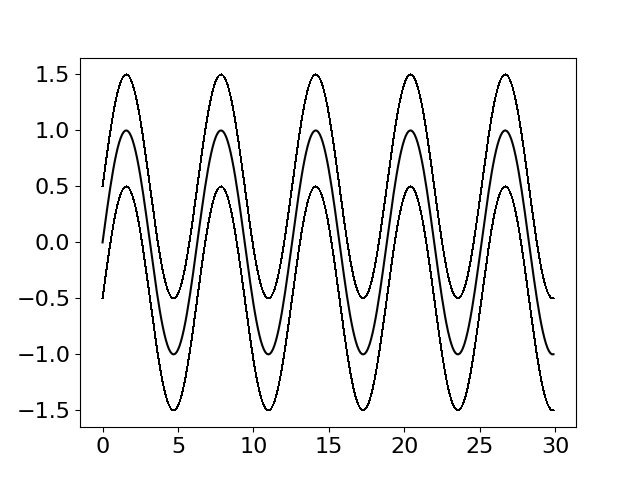

In [101]:
tt=np.arange(0,30,0.1)
yy=np.sin(tt)
yy2=yy+0.5
plt.plot(tt,yy,c='k',alpha=1.)
# plt.plot(tt,yy-0.5,c='k',alpha=-1.)
nplot=500
for _ in range(nplot):
    plt.plot(tt,yy2,c='k',alpha=1./float(nplot))
# plt.plot(tt,yy2,c='k',alpha=0.5)

YY =np.stack(nplot*[yy],axis=1)
plt.plot(tt,YY-0.5,c='k',alpha=1./float(nplot))

In [91]:
YY =np.stack(nplot*[yy],axis=1)

In [95]:
YY

array([ 0.        ,  0.09983342,  0.19866933, ..., -0.98948708,
       -0.9989818 , -0.99849503])

In [102]:
from matplotlib.collections import LineCollection,PatchCollection,PathCollection
import matplotlib.patheffects as path_effects

In [ ]:
path_effects.

In [103]:
ax.annotate?

In [139]:
np.random.randn(10)

array([ 0.43491658,  0.72901061,  1.09444566, -1.28487282, -0.03979329,
        0.651496  , -0.89712591, -1.70817271,  0.69180905,  0.32467352])

In [144]:
mpl.get_backend()

u'nbAgg'

In [150]:
# mpl.use('TkAgg')

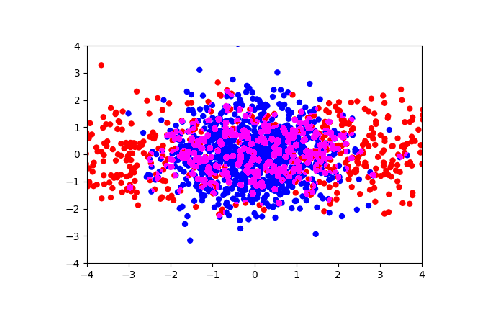

In [1]:
#Closest soln I could find
#https://stackoverflow.com/questions/26702176/is-it-possible-to-do-additive-blending-with-matplotlib?rq=1

from matplotlib import pyplot as plt
import numpy as np

# mpl.use('TkAgg')

x1 = np.random.randn(1000)
y1 = np.random.randn(1000)
x2 = np.random.randn(1000) * 5
y2 = np.random.randn(1000)

fig, ax = plt.subplots()
ax.scatter(x1,y1,c=cp,edgecolors='none')
ax.set_xlim(-4, 4)
ax.set_ylim(-4, 4)
ax.patch.set_facecolor("none")
ax.patch.set_edgecolor("none")
fig.canvas.draw()

w, h = fig.canvas.get_width_height()
img = np.frombuffer(fig.canvas.buffer_rgba(), np.uint8).reshape(h, w, -1).copy()
 
ax.clear()
ax.scatter(x2,y2,c='r',edgecolors='none')
ax.set_xlim(-4, 4)
ax.set_ylim(-4, 4)
ax.patch.set_facecolor("none")
ax.patch.set_edgecolor("none")

fig.canvas.draw()

img2 = np.frombuffer(fig.canvas.buffer_rgba(), np.uint8).reshape(h, w, -1).copy()

img[img[:, :, -1] == 0] = 0
img2[img2[:, :, -1] == 0] = 0

fig.clf()

plt.imshow(np.maximum(img, img2))
plt.subplots_adjust(0, 0, 1, 1)
plt.axis("off")
plt.show()

In [2]:
from matplotlib import pyplot as plt
import numpy as np
%load_ext autoreload
%autoreload 2
from utils import SH,DIFF
fn_part='./logs/Model_0228_003046_trop1d_tinyExp_72acc/peot_partitions/PeOT_{}{}.{}{}.npy'
fmts=['{}']
part_names=[]

fmats=[('{}',0,0,'Or'),('{}',1,0,'And'),('{}',1,1,'And'),('{}',1,2,'And'),('{}',1,3,'And')]
part_names=[fn_part.format(*fm) for fm in fmats]

part_names

loadC = lambda pth: (np.load(pth.format('pos'))[...,0],np.load(pth.format('neg'))[...,0])
Clusters=[loadC(fmp) for fmp in part_names]

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


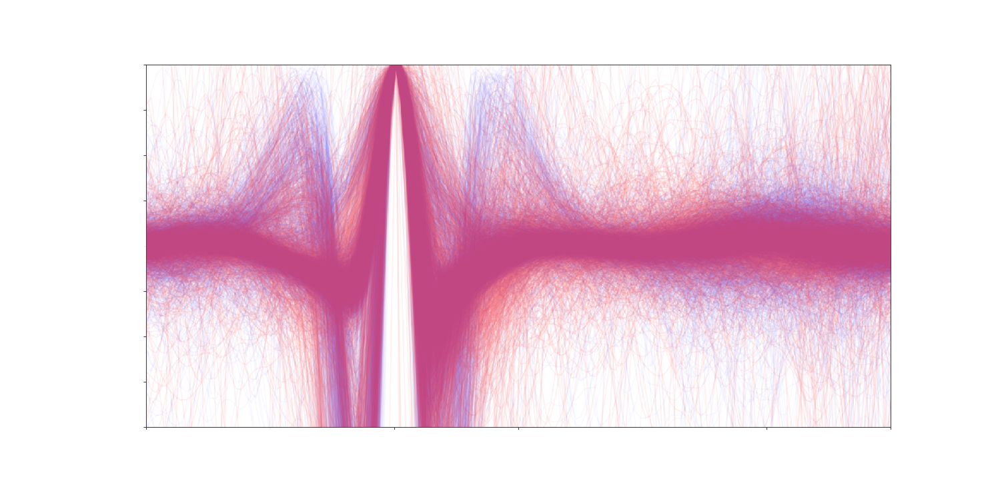

In [43]:
#def show_ecgs( X ,fig=None,ax=None):
Xp,Xn=Clusters[0]
N=max(len(Xp),len(Xn))
ap=N/float(len(Xp))
an=N/float(len(Xn))
alpha=0.05
lnwidth=2.

#    plt_latex_settings()#good enough
time=np.linspace(-0.2,0.4,150)
zero_time = np.where(time>=0.)[0][0]# 0~time[50]

plt_Xp = Xp / Xp[:,zero_time:zero_time+1]#peak normalize
plt_Xn = Xn / Xn[:,zero_time:zero_time+1]#peak normalize

fig,ax=plt.subplots(figsize=(20,10))

# ax.plot(time,plt_Xp.T,c=cp,linewidth=lnwidth)
ax.plot(time,plt_Xp.T,c=cp,alpha=alpha*ap,linewidth=lnwidth)
ax.set_ylim([-1.,1.])
ax.set_xlim([time.min(),time.max()])
ax.set_yticklabels([])
ax.set_xticklabels([])
ax.patch.set_facecolor("none")
ax.patch.set_edgecolor("none")
fig.canvas.draw()

w, h = fig.canvas.get_width_height()
img = np.frombuffer(fig.canvas.buffer_rgba(), np.uint8).reshape(h, w, -1).copy()
ax.clear()

# ax.plot(time,plt_Xn.T,c='r',linewidth=lnwidth)
ax.plot(time,plt_Xn.T,c='r',alpha=alpha*an,linewidth=lnwidth)
ax.set_ylim([-1.,1.])
ax.set_xlim([time.min(),time.max()])
ax.set_yticklabels([])
ax.set_xticklabels([])

ax.patch.set_facecolor("none")
ax.patch.set_edgecolor("none")

fig.canvas.draw()

img2 = np.frombuffer(fig.canvas.buffer_rgba(), np.uint8).reshape(h, w, -1).copy()
img[img[:, :, -1] == 0] = 0
img2[img2[:, :, -1] == 0] = 0

fig.clf()

plt.imshow(img,alpha=0.5)
plt.imshow(img2,alpha=0.5)
# plt.imshow(np.maximum(img, img2))
plt.subplots_adjust(0, 0, 1, 1)
plt.axis("off")
plt.show()

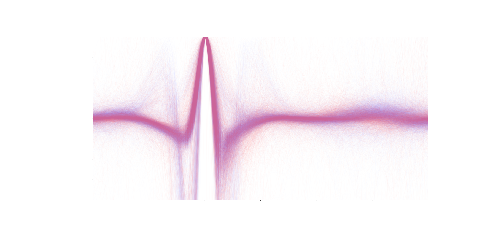

In [39]:
plt.imshow(img,alpha=0.5)
plt.imshow(img2,alpha=0.5)

plt.subplots_adjust(0, 0, 1, 1)
plt.axis("off")
plt.show()

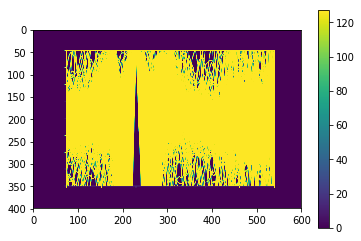

In [29]:
img[:,:,3]/=2.
plt.imshow(img[:,:,3])
plt.colorbar()
plt.show()


In [24]:
ax.patch.set_facecolor?

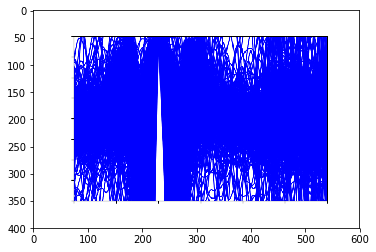

In [10]:
plt.imshow(img)
plt.show()

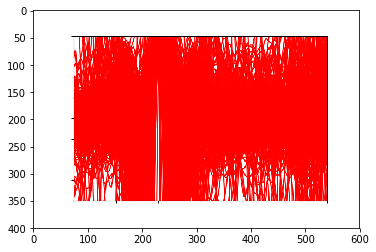

In [20]:
plt.imshow(img2)
plt.show()

In [21]:
dimg=img-img2
dX= Xp-Xn

ValueError: operands could not be broadcast together with shapes (4748,150) (2252,150) 

In [19]:
np.max(dimg),np.min(dimg)

(255, 0)

In [17]:
DIFF(img,img2)

NotFoundError: Could not find valid device for node.
Node:{{node Abs}}
All kernels registered for op Abs :
  device='XLA_GPU'; T in [DT_FLOAT, DT_DOUBLE, DT_INT32, DT_INT64, DT_BFLOAT16, DT_HALF]
  device='XLA_CPU'; T in [DT_FLOAT, DT_DOUBLE, DT_INT32, DT_INT64, DT_BFLOAT16, DT_HALF]
  device='XLA_CPU_JIT'; T in [DT_FLOAT, DT_DOUBLE, DT_INT32, DT_INT64, DT_BFLOAT16, DT_HALF]
  device='XLA_GPU_JIT'; T in [DT_FLOAT, DT_DOUBLE, DT_INT32, DT_INT64, DT_BFLOAT16, DT_HALF]
  device='CPU'; T in [DT_INT64]
  device='CPU'; T in [DT_INT32]
  device='CPU'; T in [DT_DOUBLE]
  device='CPU'; T in [DT_HALF]
  device='CPU'; T in [DT_FLOAT]
  device='GPU'; T in [DT_INT32]
  device='GPU'; T in [DT_INT64]
  device='GPU'; T in [DT_DOUBLE]
  device='GPU'; T in [DT_HALF]
  device='GPU'; T in [DT_FLOAT]
 [Op:Abs] name: Abs/

In [16]:
np.max(img.reshape([-1,4]),axis=0)

array([255, 255, 255, 255], dtype=uint8)

In [10]:
plt.subplots_adjust?

In [ ]:
DIFF(img[:,:,0],img[:,:,1])